# Image Processing

This notebook gives a guide to image analysis in python.  It borrows extensivly from this excellent set of [notebooks](https://guiwitz.github.io/PyImageCourse_beginner/README.html) which provide additinal details and examples from the field of cell biology.

## Libraries
In addition to numpy and matplotlib we will also use [scikit-image](https://scikit-image.org) (skimage).

In [1]:
import numpy as np
import skimage
import skimage.io
import matplotlib.pyplot as plt


## monotone images

we will download the data sets direclty from the internet.  This is an increadibly useful trick.  In the example the format is a TIF, but JPG also works.

The images will be stored as 2dimentional arrays.  In cases below we will also add a third dimention which is color. 

In [2]:
image = skimage.io.imread(
    'https://cildata.crbs.ucsd.edu/media/images/13901/13901.tif')


here we check the size and data type of the image and make a plot.

data type:  <class 'numpy.ndarray'>
shape of the image:  (1024, 1360)


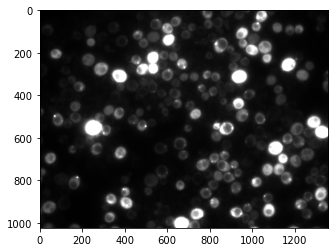

In [3]:
print("data type: ",type(image))
print("shape of the image: ",np.shape(image))

plt.imshow(image, cmap='gray');

**note**: the cmap varibale adjusts the colormap used in displaing the image.  [This](https://matplotlib.org/stable/tutorials/colors/colormaps.html) gives many nice options.  Experiment with one or two.  These images which map color to the value of the array represent false color.

a super useful fact is that since these are just two dimensional arrays we can use all the standard numpy array indexing and math funcitons.   Some useful examples are
1. index a sub-array to make a cuttout
1. add noise
1. convolve to reduce noise
1. threahold, to find the brigh or dim parts
1. create a hitogram from the pixels
1. filter to find signals or remove noise
1. add images together
1. anything else you can imagine.

Here is an exmaple of selctcing a cuttout.   **Note** the first index is displayed as Y and the second as X.

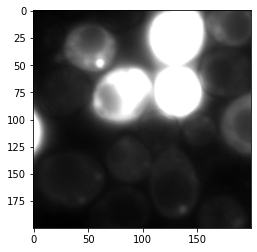

In [4]:
cuttout = image[200:400,400:600]
plt.imshow(cuttout, cmap='gray');

You can also plot the array using a linear (or log) plot to get a feel for the values.  Here we use the "ravel()" funciton to conver the 2d array into a 1d array.

min:  314 max:  4095


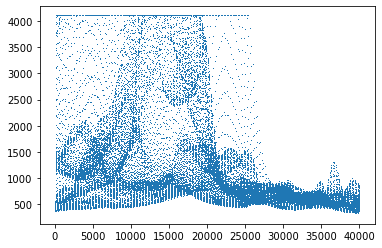

In [5]:
plt.plot(cuttout.ravel(),",")
print("min: ",np.min(cuttout),"max: ",np.max(cuttout))

Note that the values in this tiff are integers that run from 0 to 4095. (e.g., 2^12 values)  The large concentration at 4095 indicate that the image is saturated.

#### excercises and ideas

you could make a hisotgram of the pixels, add random noise, or perform other math operaiotns on this array.    Try these out.  To get you started, here is an example where we threhold the image to remove the low values.  Tricks like this are really handy for peak finding etc.

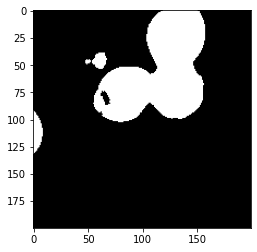

In [6]:
tmp = np.zeros(np.shape(cuttout))

pass_cut = np.where(cuttout > 2500)
tmp[pass_cut] = 1

plt.imshow(tmp, cmap='gray');

you can use this threshold trick to make an image of yourslef that looks like the faomous Che portriate. 

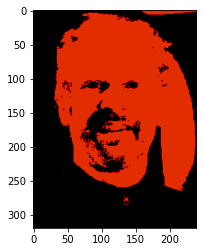

In [7]:
file = "https://astro.uchicago.edu/depot/images/members/_58a0236.jpg"
image_jeff = skimage.io.imread(file)
BW_jeff = (image_jeff[:,:,0])
#plt.plot(BW_jeff.ravel(),",")

jeff_che = np.zeros(np.shape(BW_jeff))

pass_cut = np.where(BW_jeff > 135)
jeff_che[0,0] = 1.7 ## forcing the color scale to behave
jeff_che[pass_cut] = 1


plt.imshow(jeff_che, cmap='gist_heat');

Try it yourself for fun.  Mine was not a work of art, but perhaps I should get a beret and try again.

# Color images
next we will read in a color image. This example is from a microscope where color is an important tracer.  We will seperate the three components and also play with filtering.

In [8]:
image_rgb = skimage.io.imread(
    'https://github.com/guiwitz/PyImageCourse_beginner/raw/master/images/46658_784_B12_1.tif')


we will check the size of this array, as we expext it is three dimensional with the third dimension corresponding to color.

In [9]:
print("data type: ",type(image_rgb))
print("shape of the image: ",np.shape(image_rgb))

data type:  <class 'numpy.ndarray'>
shape of the image:  (2048, 2048, 3)


Next we will use imshow to plot these data.  By default it interprets and displays the entries in the third dimension as red, green, and blue respectively.

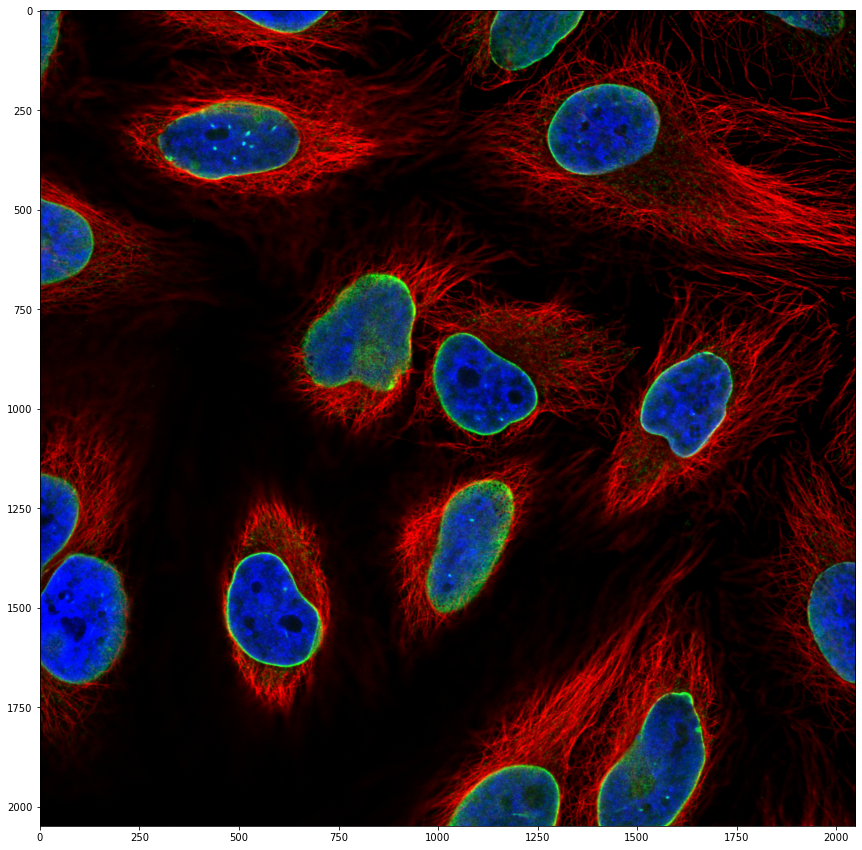

In [10]:
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(image_rgb);

Now lets isolate signle colors from this image.  Since the array indexes start from 0 we have channel 0 is red, 1 is green, and 2 is blue. I have shown just the blue band.  as an excercise try plotting the others.

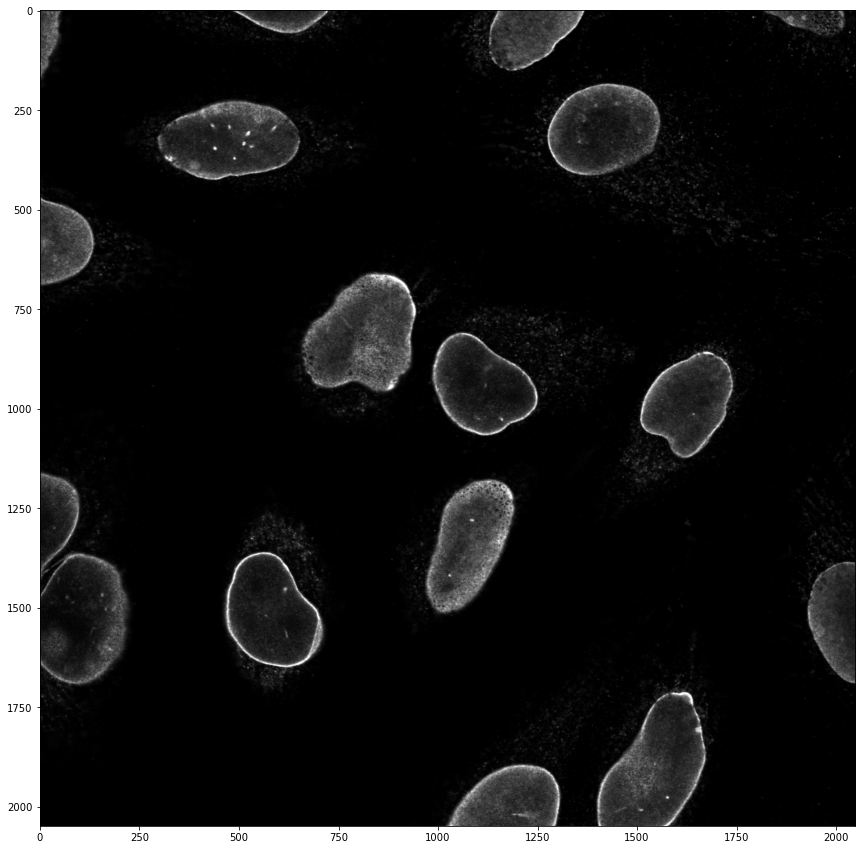

In [11]:
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(image_rgb[:,:,1],"gray");

## zooming in and doing some signal processing

Lets zoom in on a single cell.

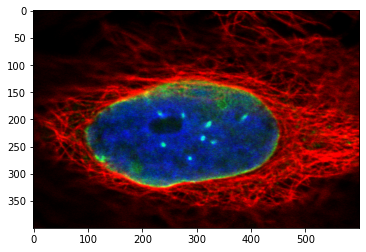

In [15]:
cuttout_rgb = image_rgb[100:500,200:800]
plt.imshow(cuttout_rgb);

perhpas the blue dots represent some protine that has been activited.  We might want to count the number automatically.   Lets start by choosing the color (or ratio) that best seperates this tracer

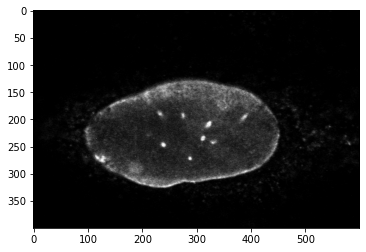

In [16]:
cuttout_mono = image_rgb[100:500,200:800,1]
plt.imshow(cuttout_mono,"gray");

Next we want to filter this signal to surpress non-point like features.  We have very many optoions:
1. convolve with a rotational top hat with mean zero.  This will supress any signals that are constant or slowly varying.  This is a spatial band pass filter
1. [matched filter](https://en.wikipedia.org/wiki/Matched_filter). this technique creates a filter that is optional for maximizing the singal to noise of the pattern yuo want to extract.  It is in equivelent to convolving by the shape of the singla you want to measure, while diving out the power spectrum of the noise in the image.  Here noise is any contribution that is not from the signal you want.  So if are looking for owls in trees, the signal would be the shape of an owl, and the noise would be camera noise as well as the signal from trees. 
1. a simple high pass filter. 

We will start with opiton 3.  It is the worst choice, but is very instructive.

## implementing a filter
Our plan it to:
1. FFT the data
1. create a mask in fourier space to set unwatned frequencies to zero, but to leave the other frequnecices unchanged
1. inverse FFT the mask times the FFT.  This is equielent to convolving the filter.

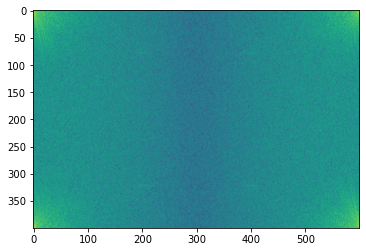

In [46]:
fft_data = np.fft.fft2(cuttout_mono)
## this plot shows where the information now lives in fourier space.  
## I had to take the log (eg use dB) since it is so concentrated at low wave numbers
## note: the zero frequency mode is in the corners
plt.imshow(10*np.log10(np.abs(fft_data)))
plt.show()

Next we will figure out the frequencies of this fourier transfomrm.  We will do this using the fftfreq to get the 1d versions.  Then we will use mesh grid to make 2d arrays of the freuqncies.  EG, the frequency in every pixel.  

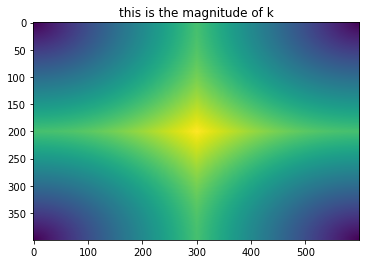

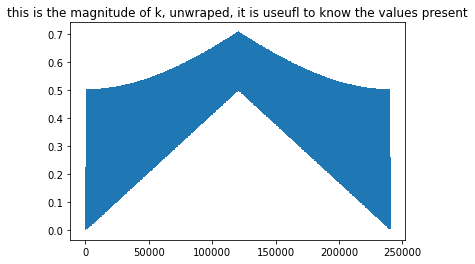

In [56]:
## figure out the freuqncies
kx = np.fft.fftfreq(np.shape(fft_data)[1])
ky = np.fft.fftfreq(np.shape(fft_data)[0])
#print(np.shape(filter_mask),np.shape(kx),np.shape(ky))
ky2d,kx2d = np.meshgrid(kx,ky)

## compute the magntude of k for use in our filter
mag_k = np.sqrt(ky2d**2 +kx2d**2)

#plt.title("this is kx-- confusingly x and y are refersed for imshow :(")
#plt.imshow(kx2d)
#plt.show()

#plt.title("this is ky-- confusingly x and y are refersed for imshow :(")
#plt.imshow(ky2d)
#plt.show()

plt.title("this is the magnitude of k")
plt.imshow(mag_k)
plt.show()

plt.title("this is the magnitude of k, unwraped, it is useufl to know the values present")
plt.plot(mag_k.ravel(),",")
plt.show()





With this in hand we can set a threshold on the magnitude of k to make our filter.

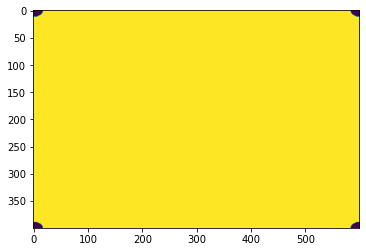

In [83]:
## make a mask for filtering in fourier space
filter_mask = np.ones(np.shape(fft_data))
freq_to_cut = np.where(mag_k < 0.03)
#freq_to_cut = np.where(np.logical_or(np.abs(kx2d)< 0.03,
#                                      np.abs(ky2d)< 0.03))

filter_mask[freq_to_cut] = 0
plt.imshow(filter_mask)
plt.show()



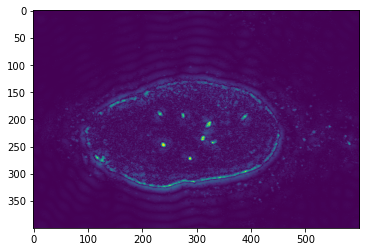

In [128]:
## apply the filter
filtered = np.fft.ifft2(fft_data*filter_mask)
plt.imshow(np.abs(filtered))
plt.show()

#plt.plot(np.abs(filtered).ravel(),",")


### excercises
1. adjust the filter to maximize the S/N on the brigth dots
1. try an anisotropic filter by filtering on kx or ky rather than mag_k
1. see what happens if you didn't center the filter correclty (eg apply FFTshift to mess this up)

## defining a top hat filter in real space

Here we are goign to define a real space filter with mean zero which we will convolve with our image to supress items that arn't point sources.  

The key points are:
1. define spatial coordinates for our map
1. use these to define a filter in real space
1. then convolve these two maps to get a filtered image

**note** the phase of the final image depends on centering the filter in real space propertly 

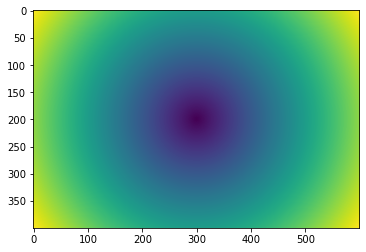

In [151]:
## make spatial coordinates

x = np.linspace(-np.shape(cuttout_mono)[0]/2,
                np.shape(cuttout_mono)[0]/2,
                np.shape(cuttout_mono)[0])
y = np.linspace(-np.shape(cuttout_mono)[1]/2,
                np.shape(cuttout_mono)[1]/2,
                np.shape(cuttout_mono)[1])
#print(np.size(x),np.size(y))
x2d,y2d = np.meshgrid(y,x)
radius = np.sqrt(x2d**2 + y2d**2)
plt.imshow(radius)
plt.show()


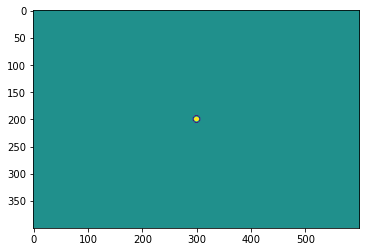

In [138]:
## make the real space filter
filter_scale = 5 ## in pixels

real_space_filter = np.zeros(np.shape(radius))
real_space_filter[np.where(radius < filter_scale)] = 1
real_space_filter[np.where(np.logical_and(radius > filter_scale,
                               radius < filter_scale*np.sqrt(2)
                              )
                )] = -1
plt.imshow(real_space_filter)
#print(np.mean(real_space_filter))

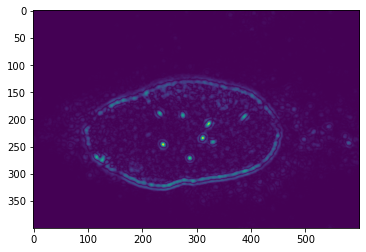

In [147]:

## apply the filter
fourier_filter = np.fft.fft2(np.fft.fftshift(real_space_filter))
filtered = np.fft.ifft2(fft_data*fourier_filter)
plt.imshow(np.abs(filtered))
plt.show()


it sitll isn't that great.  Though note taht this filter has much less ringing than the simple high pass.

lets try a threshold to see if we can better isolate the points of intreest.

First we will plot the image, then we will choose a suitable level for the thresholding, then apply this as we did in the che image example.




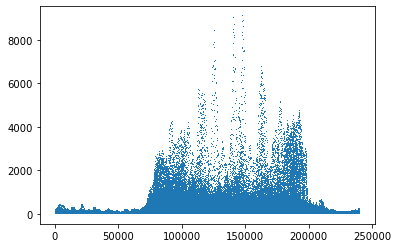

In [149]:
plt.plot(np.abs(filtered).ravel(),",")
plt.show()

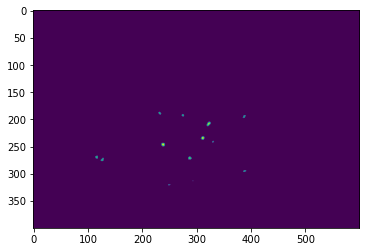

In [150]:
threshold_and_filter = np.copy(filtered)
bad = np.where(np.abs(filtered) < 4500 )
threshold_and_filter[bad] = 0

plt.imshow(np.abs(threshold_and_filter))
plt.show()

now this is pretty good.  There looks to be 1-2 fals positives with the visible singlas making the cut.  To go better then this gaussian fits could be performed on the initial image, but centered at these canidate locations.  the fits that are clearly in the cell wall would be fit with a gaussian with a large elipticity.  An elipticity cut could then sepearte the false positives.  

It is also possible that better use of color inforamtion could help. For example, we are using the green chanel in isolaiton. combining this with the blue through a ratio, sum, or other discriminent would better seperate the true detections from the false positives.  

In any case, you have enough tools to solve many many problems.

## Noise and gaussian blurs

Here we show two other standard tools of image processing.   Noise and the use of a gaussin blurr to smooth it out.


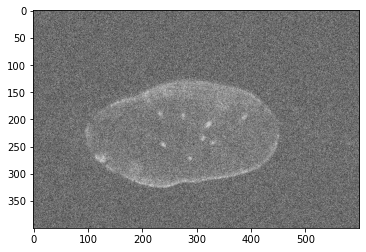

In [159]:
## add noise to our image

gaussin_noise = np.random.randn(np.shape(cuttout_mono)[0],
                                np.shape(cuttout_mono)[1])*70

Noisy_image = cuttout_mono + gaussin_noise

plt.imshow(Noisy_image,"gray")  ## looks more like typcal data
plt.show()

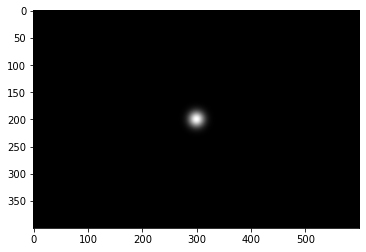

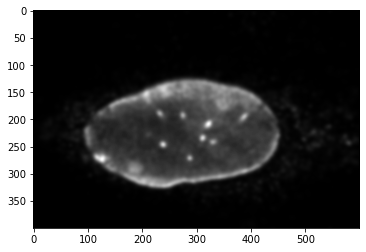

In [163]:
## convolve with a gaussian to smooth it

# make the gaussin using the radius defined above

gaussian = np.exp(-.5 * (radius/3.)**2)
plt.imshow(ga,"gray")
plt.show()

## apply the filter
fourier_filter = np.fft.fft2(np.fft.fftshift(gaussian))
filtered = np.fft.ifft2(fft_data*fourier_filter)
plt.imshow(np.abs(filtered),"gray")
plt.show()

# having fun with other data sets

## The Hubbel Ultra Deep Field

[wikipedia](https://en.wikipedia.org/wiki/Hubble_Ultra-Deep_Field)

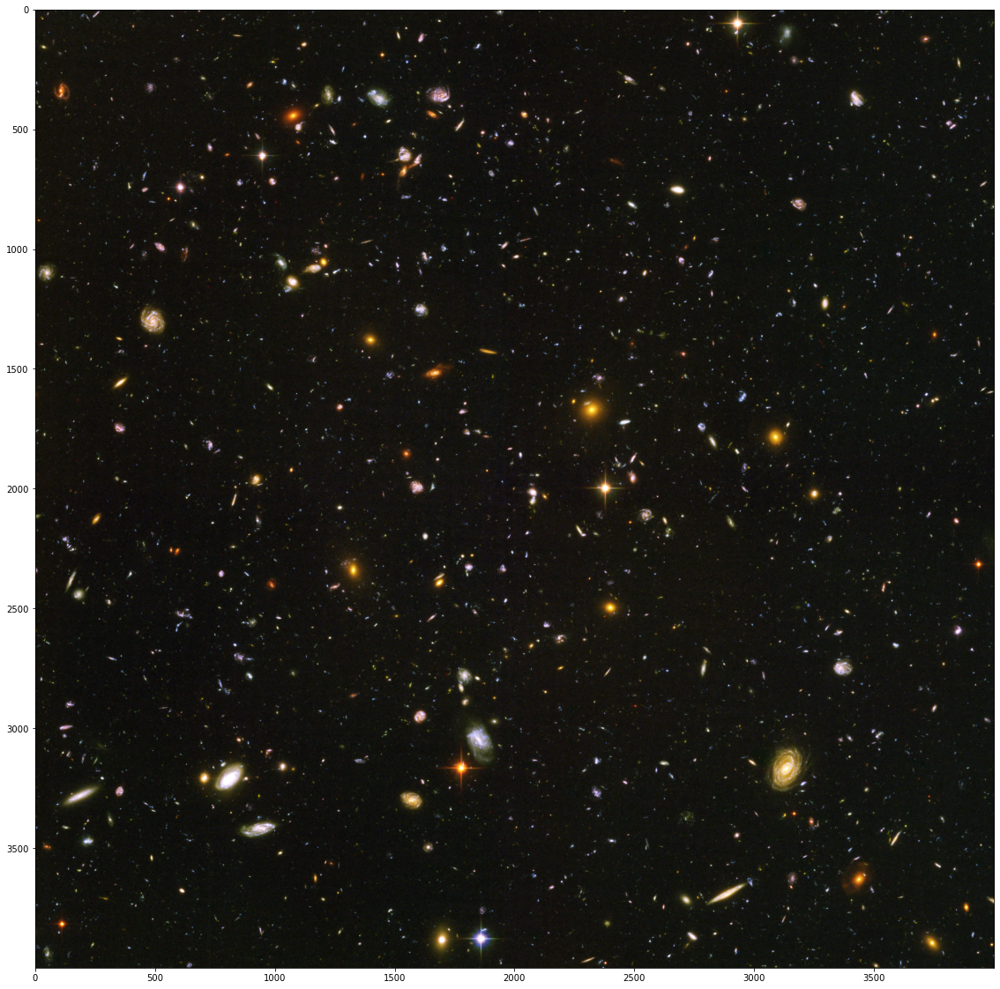

In [164]:
hubelUDF = skimage.io.imread(
    'https://esahubble.org/media/archives/images/publicationtiff/heic0611b.tif')
fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(hubelUDF);

## color

In astronomy color is defined as ratios between different photometrix bands.  Since the intensity of light varry so much we typically take the log of the intensity.  This is called the magnitude system.  so color ends up as differnces in the logrytmnic intensity.  Try this with R-B or other combinations of color.

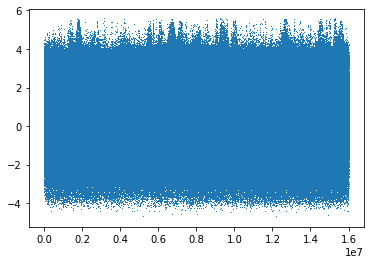

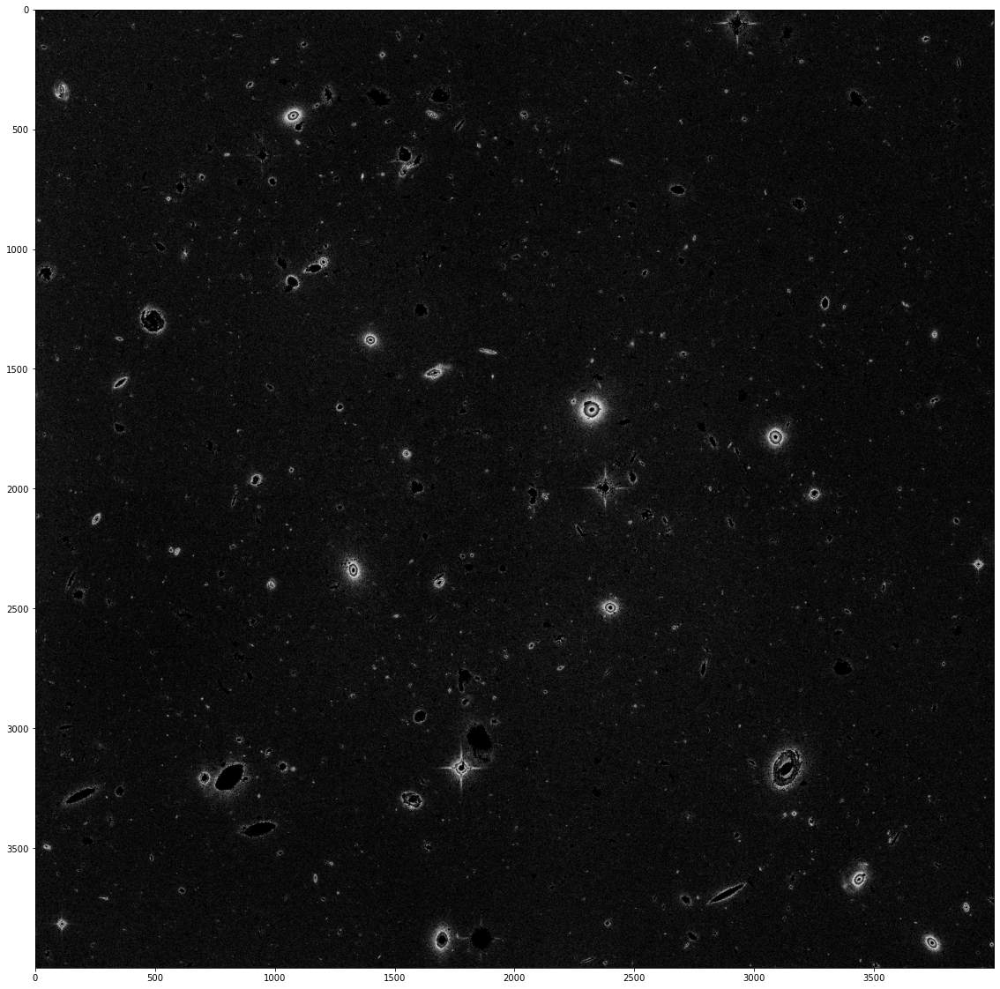

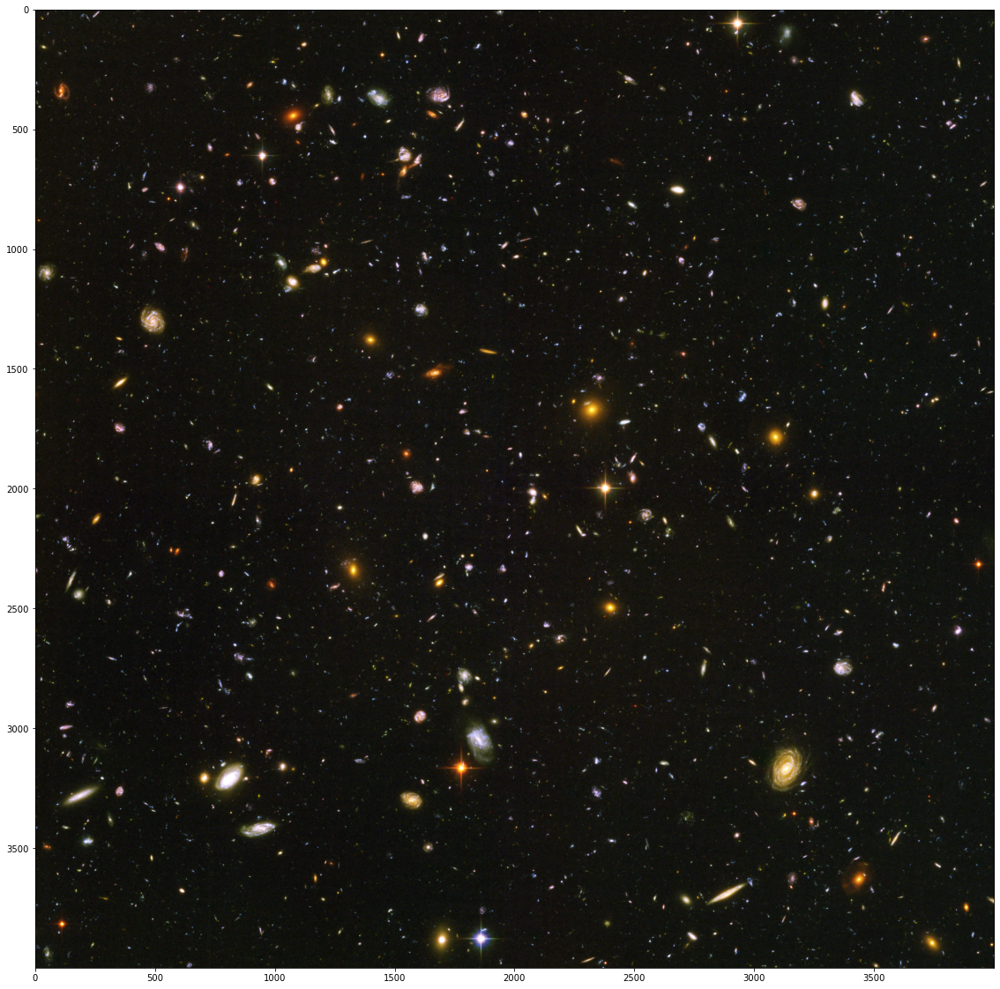

In [214]:
intensity = hubelUDF[:,:,0] + hubelUDF[:,:,1] + hubelUDF[:,:,2]
color = np.log(hubelUDF[:,:,0]+1.) - np.log(hubelUDF[:,:,2]+1.)


plt.plot(color.ravel(),",")
plt.show()

red = np.where(color > 1)
blue = np.where(color < 1)

red = np.copy(intensity)
red[blue] = 0


fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(red,"gray");
plt.show()

fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(hubelUDF);


## JWST!

matched filter for eliptical galacies could be a fun excercise.

(290.0, 990.0)

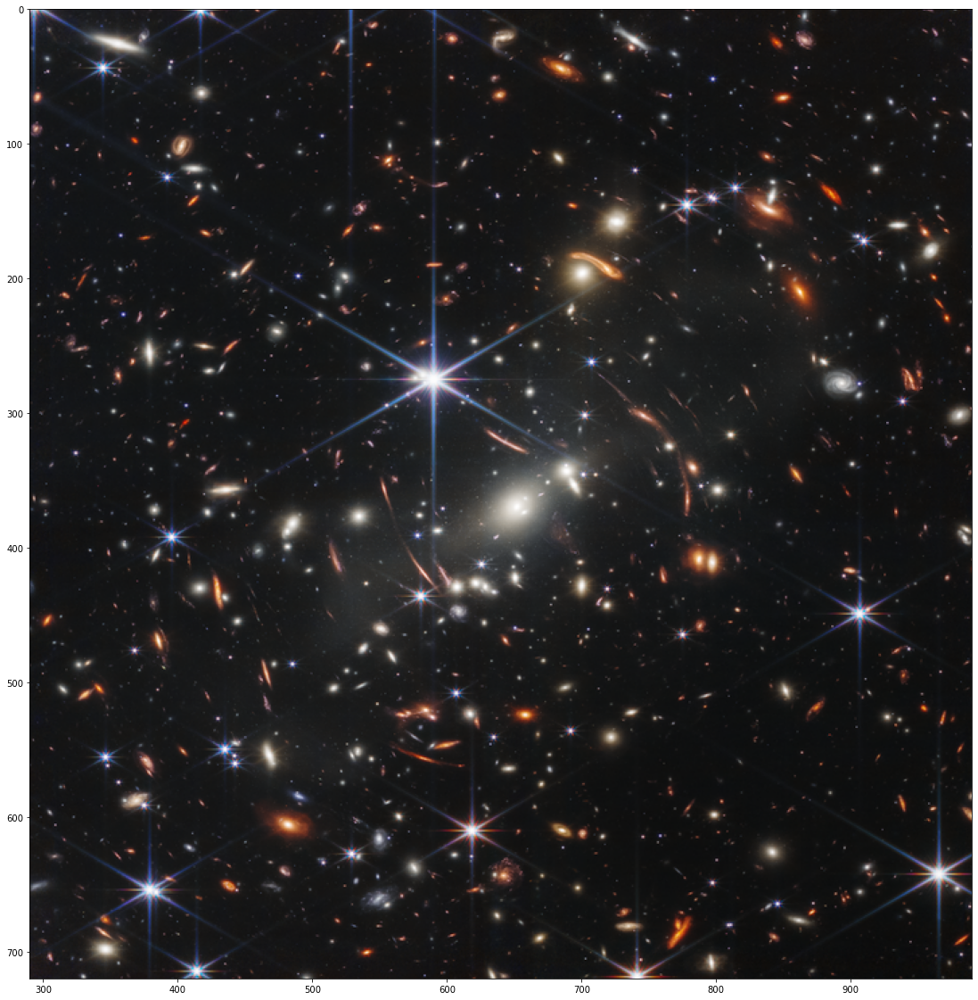

In [215]:
file = "https://stsci-opo.org/STScI-01G7DCYVZ899DGSY684E801B2Y.png"
JWST = skimage.io.imread(
    file)

fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(JWST)
plt.xlim(290,990)



## Bubble chamber image analysis

try to use filters to remove noise and to extract tracks.   There are edge filters that could be helpful here. 

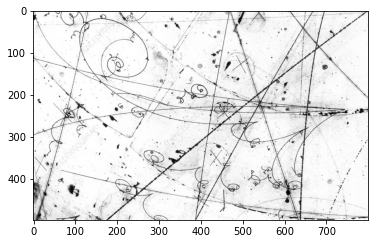

In [216]:
file = "https://media.sciencephoto.com/image/a1380053/800wm/A1380053-Neutrino_particle_interaction_event.jpg"

bubble = skimage.io.imread(file)
plt.imshow(bubble)

## analysis of people

this is a challenge problem.  can you create a matched filter that isolates the faces of people (or masks) to automatically count the number of people in this image?

data type:  <class 'numpy.ndarray'>
shape of the image:  (2048, 2048, 3)


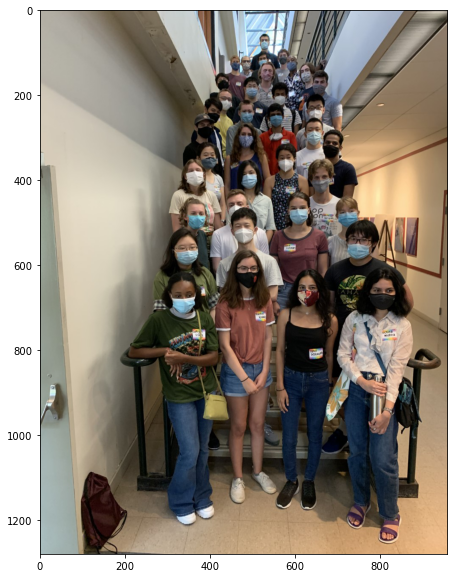

In [217]:
file = "https://d3qi0qp55mx5f5.cloudfront.net/physics/i/news/2021-22_Grad_group_photo.jpg?mtime=1631893463"
UofCphysicsclass = skimage.io.imread(file)

print("data type: ",type(image_rgb))
print("shape of the image: ",np.shape(image_rgb))

fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(UofCphysicsclass);
plt.show()


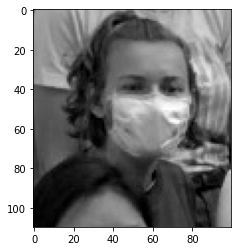

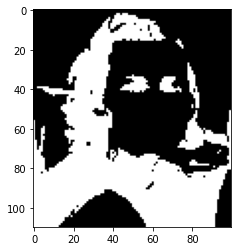

(110, 100)
4.163336342344337e-19


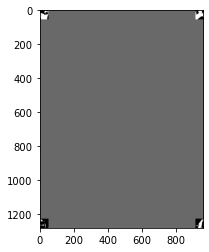

In [254]:
xm=440
ym = 310

one_head = UofCphysicsclass[xm:xm+110,ym:ym+100,2]
plt.imshow(one_head,"gray")
plt.show()

templet = np.zeros(np.shape(one_head))

pass_cut = np.where(one_head > 75)
templet[pass_cut] = 1
templet -=np.mean(templet)
templet *=-1.

plt.imshow(templet,"gray")
plt.show()

filter_templet = np.zeros(np.shape(UofCphysicsclass[:,:,2]))
print(np.shape(one_head))

filter_templet[0:110,0:100] = templet
filter_templet = np.roll(filter_templet,(-50,-55),axis=(1, 0))

print(np.mean(filter_templet))

plt.imshow(filter_templet,"gray")

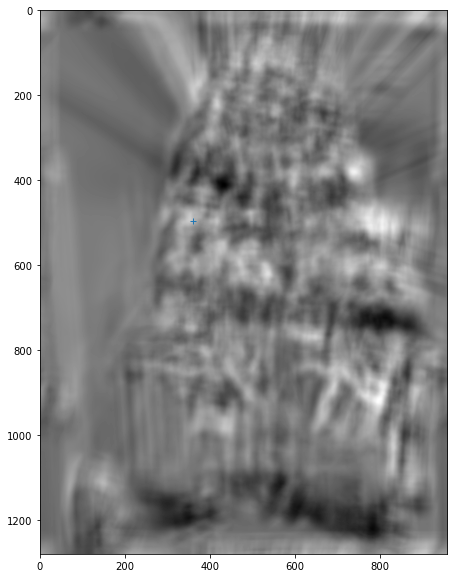

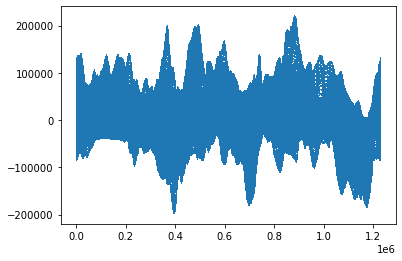

In [252]:
fftimage = np.fft.fft2(UofCphysicsclass[:,:,0])
fft_templet= np.fft.fft2(filter_templet)

filtered_image = np.fft.ifft2(fftimage*fft_templet)

fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(np.real(filtered_image),"gray");
plt.plot(np.array(ym+50),np.array(xm+55),"+")
plt.show()

plt.plot(np.real(filtered_image.ravel()),",")